In [1]:
import nannyml as nml

In [2]:
import pandas as pd

url = "https://raw.githubusercontent.com/NannyML/examples/main/webinars/inforshare_workshop/medicalcov-2015_2016_2017_2018-IL-reference.csv"
reference_df = pd.read_csv(url)

url_analysis = "https://raw.githubusercontent.com/NannyML/examples/main/webinars/inforshare_workshop/medicalcov-2015_2016_2017_2018-IL-analysis.csv"
analysis_df = pd.read_csv(url_analysis)

url_targets = "https://raw.githubusercontent.com/NannyML/examples/main/webinars/inforshare_workshop/medicalcov-2015_2016_2017_2018-IL-analysis_targets.csv"
analysis_with_targets_df = pd.read_csv(url_targets)

# Display the first few rows of the DataFrame
reference_df.head()

,AGEP,SCHL,MAR,SEX,DIS,ESP,CIT,MIG,MIL,ANC,...,DEYE,DREM,PINCP,ESR,ST,FER,RAC1P,y_true,y_pred,y_pred_proba
0,62.0,13.0,5.0,2.0,2.0,0.0,1.0,1.0,4.0,1.0,...,2.0,2.0,11700.0,3.0,17.0,0.0,2.0,1,1,0.84
1,36.0,19.0,5.0,2.0,2.0,0.0,1.0,1.0,4.0,1.0,...,2.0,2.0,5270.0,3.0,17.0,2.0,2.0,1,1,0.90
2,55.0,16.0,3.0,2.0,2.0,0.0,1.0,1.0,4.0,1.0,...,2.0,2.0,0.0,6.0,17.0,0.0,1.0,1,0,0.34
3,32.0,16.0,5.0,1.0,2.0,0.0,5.0,1.0,4.0,1.0,...,2.0,2.0,30000.0,1.0,17.0,0.0,8.0,0,0,0.02
4,34.0,11.0,5.0,2.0,2.0,0.0,5.0,1.0,4.0,1.0,...,2.0,2.0,0.0,6.0,17.0,2.0,8.0,0,0,0.14


Let's start with estimating performance

In [3]:
estimator = nml.CBPE(
    y_pred_proba='y_pred_proba',
    y_pred='y_pred',
    y_true='y_true',
    metrics=['roc_auc', 'accuracy', 'f1'],
    chunk_size=5000,
    problem_type='classification_binary',
)
estimator.fit(reference_df)

results_performance_estimation = estimator.estimate(analysis_df)

In [4]:
display(results_performance_estimation.filter(period='analysis').to_df())

chunk                                                        \
              key chunk_index start_index end_index start_date end_date   
0        [0:4999]           0           0      4999       None     None   
1     [5000:9999]           1        5000      9999       None     None   
2   [10000:14999]           2       10000     14999       None     None   
3   [15000:19999]           3       15000     19999       None     None   
4   [20000:24999]           4       20000     24999       None     None   
5   [25000:29999]           5       25000     29999       None     None   
6   [30000:34999]           6       30000     34999       None     None   
7   [35000:39999]           7       35000     39999       None     None   
8   [40000:44999]           8       40000     44999       None     None   
9   [45000:49999]           9       45000     49999       None     None   
10  [50000:54999]          10       50000     54999       None     None   
11  [55000:59999]          11       55000     59999       None     None   
12  [60000:64999]          12       60000     64999       None     None   
13  [65000:69999]          13       65000     69999       None     None   
14  [70000:74999]          14       70000     74999       None     None   
15  [75000:79999]          15       75000     79999       None     None   
16  [80000:87204]          16       80000     87204       None     None   

               roc_auc                          ...        accuracy         \
      period     value sampling_error realized  ... lower_threshold  alert   
0   analysis  0.788807       0.005950      NaN  ...        0.748636  False   
1   analysis  0.790094       0.005950      NaN  ...        0.748636  False   
2   analysis  0.790476       0.005950      NaN  ...        0.748636  False   
3   analysis  0.790159       0.005950      NaN  ...        0.748636  False   
4   analysis  0.787923       0.005950      NaN  ...        0.748636  False   
5   analysis  0.788422       0.005950      NaN  ...        0.748636  False   
6   analysis  0.790067       0.005950      NaN  ...        0.748636  False   
7   analysis  0.786210       0.005950      NaN  ...        0.748636  False   
8   analysis  0.820722       0.005950      NaN  ...        0.748636  False   
9   analysis  0.813102       0.005950      NaN  ...        0.748636  False   
10  analysis  0.788137       0.005950      NaN  ...        0.748636  False   
11  analysis  0.788386       0.005950      NaN  ...        0.748636  False   
12  analysis  0.787710       0.005950      NaN  ...        0.748636  False   
13  analysis  0.787163       0.005950      NaN  ...        0.748636  False   
14  analysis  0.785247       0.005950      NaN  ...        0.748636  False   
15  analysis  0.792622       0.005950      NaN  ...        0.748636  False   
16  analysis  0.787157       0.004957      NaN  ...        0.748636  False   

          f1                                                    \
       value sampling_error realized upper_confidence_boundary   
0   0.551502       0.015854      NaN                  0.599063   
1   0.565774       0.015854      NaN                  0.613336   
2   0.555427       0.015854      NaN                  0.602989   
3   0.560128       0.015854      NaN                  0.607690   
4   0.549558       0.015854      NaN                  0.597120   
5   0.557196       0.015854      NaN                  0.604758   
6   0.559262       0.015854      NaN                  0.606824   
7   0.550504       0.015854      NaN                  0.598066   
8   0.665634       0.015854      NaN                  0.713195   
9   0.648305       0.015854      NaN                  0.695867   
10  0.557326       0.015854      NaN                  0.604888   
11  0.549220       0.015854      NaN                  0.596782   
12  0.547436       0.015854      NaN                  0.594998   
13  0.548302       0.015854      NaN                  0.595863   
14  0.545359       0.015854      NaN           

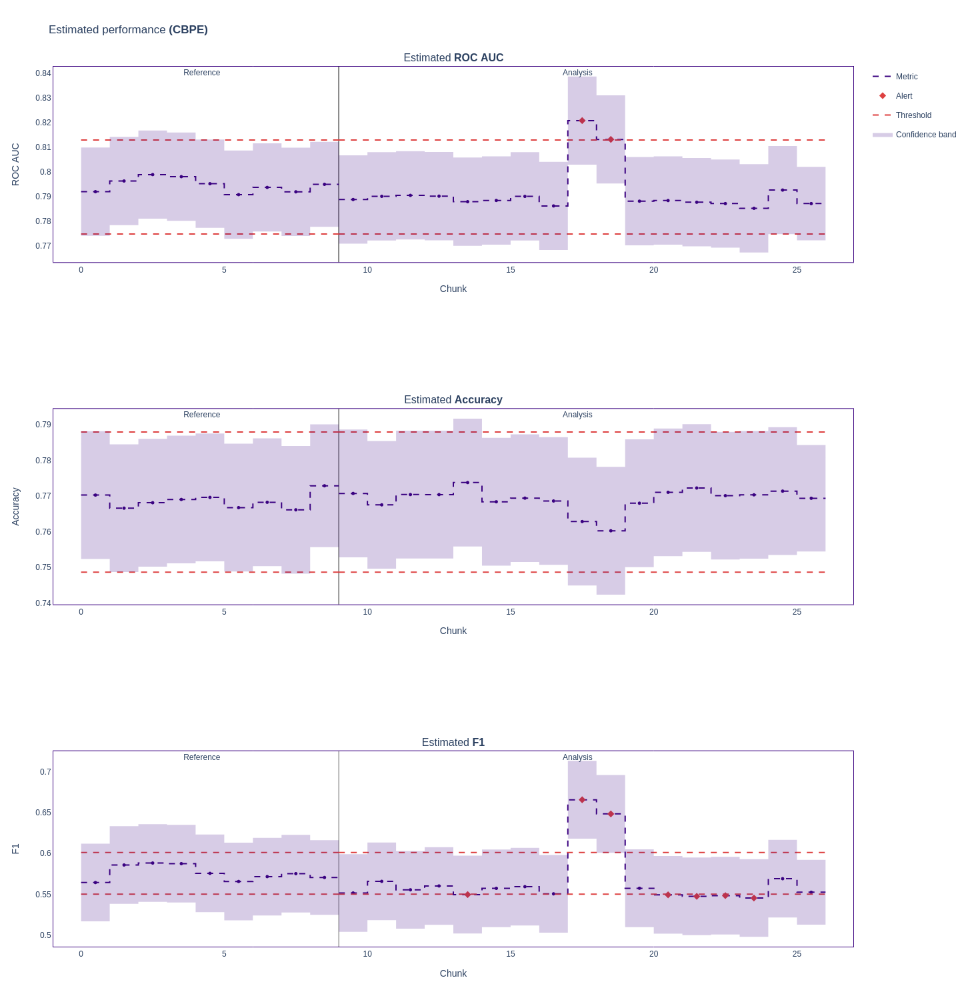

In [5]:
metric_fig = results_performance_estimation.plot()
metric_fig.show()

Now we're moving to Root Cause analysis.

In [6]:
#multivariate drift detection first
non_feature_columns = ['y_pred_proba', 'y_pred', 'y_true', 'ST']

# Define feature columns
feature_column_names = [
    col for col in reference_df.columns
    if col not in non_feature_columns
]

In [7]:
calc = nml.DataReconstructionDriftCalculator(
    column_names=feature_column_names,
    chunk_size=5000
)
calc.fit(reference_df)

In [8]:
results_multivariate = calc.calculate(analysis_df)

display(results_multivariate.filter(period='analysis').to_df())

display(results_multivariate.filter(period='reference').to_df())

chunk                                                        \
              key chunk_index start_index end_index start_date end_date   
0        [0:4999]           0           0      4999       None     None   
1     [5000:9999]           1        5000      9999       None     None   
2   [10000:14999]           2       10000     14999       None     None   
3   [15000:19999]           3       15000     19999       None     None   
4   [20000:24999]           4       20000     24999       None     None   
5   [25000:29999]           5       25000     29999       None     None   
6   [30000:34999]           6       30000     34999       None     None   
7   [35000:39999]           7       35000     39999       None     None   
8   [40000:44999]           8       40000     44999       None     None   
9   [45000:49999]           9       45000     49999       None     None   
10  [50000:54999]          10       50000     54999       None     None   
11  [55000:59999]          11       55000     59999       None     None   
12  [60000:64999]          12       60000     64999       None     None   
13  [65000:69999]          13       65000     69999       None     None   
14  [70000:74999]          14       70000     74999       None     None   
15  [75000:79999]          15       75000     79999       None     None   
16  [80000:87204]          16       80000     87204       None     None   

             reconstruction_error                                      \
      period       sampling_error     value upper_confidence_boundary   
0   analysis             0.016139  2.035165                  2.083581   
1   analysis             0.016139  2.058933                  2.107349   
2   analysis             0.016139  2.052833                  2.101250   
3   analysis             0.016139  2.061934                  2.110350   
4   analysis             0.016139  2.064632                  2.113048   
5   analysis             0.016139  2.055686                  2.104102   
6   analysis             0.016139  2.080748                  2.129165   
7   analysis             0.016139  2.073218                  2.121634   
8   analysis             0.016139  2.243393                  2.291810   
9   analysis             0.016139  2.227454                  2.275870   
10  analysis             0.016139  2.099959                  2.148376   
11  analysis             0.016139  2.049606                  2.098022   
12  analysis             0.016139  2.068574                  2.116991   
13  analysis             0.016139  2.103693                  2.152109   
14  analysis             0.016139  2.034896                  2.083312   
15  analysis             0.016139  2.069164                  2.117580   
16  analysis             0.013444  2.097468                  2.137801   

                                                                     
   lower_confidence_boundary upper_threshold lower_threshold  alert  
0                   1.986748        2.137876        2.018938  False  
1                   2.010516        2.137876        2.018938  False  
2                   2.004417        2.137876        2.018938  False  
3                   2.013518        2.137876        2.018938  False  
4                   2.016216        2.137876        2.018938  False  
5                   2.007270        2.137876        2.018938  False  
6                   2.032332        2.137876        2.018938  False  
7                   2.024802        2.137876        2.018938  False  
8                   2.194977        2.137876        2.018938   True  
9                   2.179037        2.137876        2.018938   True  
10                  2.051543        2.137876        2.018938  False  
11                  2.001190        2.137876        2.018938  False  
12                  2.020158        2.137876        2.018938  False  
13                  2.055277        2.137876        2.018938  False  
14                  1.986480        2.137876        2.018938  False  
15      

chunk                                                        \
             key chunk_index start_index end_index start_date end_date   
0       [0:4999]           0           0      4999       None     None   
1    [5000:9999]           1        5000      9999       None     None   
2  [10000:14999]           2       10000     14999       None     None   
3  [15000:19999]           3       15000     19999       None     None   
4  [20000:24999]           4       20000     24999       None     None   
5  [25000:29999]           5       25000     29999       None     None   
6  [30000:34999]           6       30000     34999       None     None   
7  [35000:39999]           7       35000     39999       None     None   
8  [40000:45404]           8       40000     45404       None     None   

             reconstruction_error                                      \
      period       sampling_error     value upper_confidence_boundary   
0  reference             0.016139  2.103466                  2.151882   
1  reference             0.016139  2.099804                  2.148221   
2  reference             0.016139  2.089489                  2.137905   
3  reference             0.016139  2.105074                  2.153491   
4  reference             0.016139  2.050260                  2.098676   
5  reference             0.016139  2.063211                  2.111627   
6  reference             0.016139  2.068484                  2.116901   
7  reference             0.016139  2.060058                  2.108474   
8  reference             0.015522  2.065816                  2.112383   

                                                                    
  lower_confidence_boundary upper_threshold lower_threshold  alert  
0                  2.055050        2.137876        2.018938  False  
1                  2.051388        2.137876        2.018938  False  
2                  2.041073        2.137876        2.018938  False  
3                  2.056658        2.137876        2.018938  False  
4                  2.001844        2.137876        2.018938  False  
5                  2.014794        2.137876        2.018938  False  
6                  2.020068        2.137876        2.018938  False  
7                  2.011642        2.137876        2.018938  False  
8                  2.019249        2.137876        2.018938  False

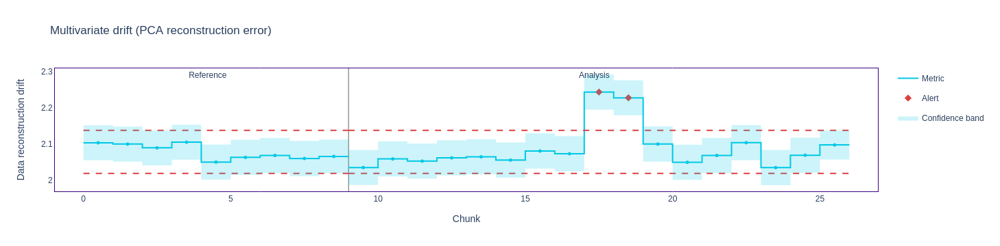

In [9]:
figure = results_multivariate.plot()
figure.show()

Now let's do univariate drift detection

In [10]:
calc = nml.UnivariateDriftCalculator(
    column_names=feature_column_names ,
    treat_as_categorical=['y_pred'],
    continuous_methods=['jensen_shannon'],
    categorical_methods=['jensen_shannon'],
)

calc.fit(reference_df)
results_univariate = calc.calculate(analysis_df)
display(results_univariate.filter(period='analysis').to_df())

chunk                                                        \
           chunk                                                         
             key chunk_index start_index end_index start_date end_date   
0       [0:8719]           0           0      8719       None     None   
1   [8720:17439]           1        8720     17439       None     None   
2  [17440:26159]           2       17440     26159       None     None   
3  [26160:34879]           3       26160     34879       None     None   
4  [34880:43599]           4       34880     43599       None     None   
5  [43600:52319]           5       43600     52319       None     None   
6  [52320:61039]           6       52320     61039       None     None   
7  [61040:69759]           7       61040     69759       None     None   
8  [69760:78479]           8       69760     78479       None     None   
9  [78480:87204]           9       78480     87204       None     None   

                      AGEP                                  ...  \
            jensen_shannon                                  ...   
     period          value upper_threshold lower_threshold  ...   
0  analysis       0.048033             0.1            None  ...   
1  analysis       0.052767             0.1            None  ...   
2  analysis       0.048369             0.1            None  ...   
3  analysis       0.052805             0.1            None  ...   
4  analysis       0.106383             0.1            None  ...   
5  analysis       0.148193             0.1            None  ...   
6  analysis       0.057004             0.1            None  ...   
7  analysis       0.048294             0.1            None  ...   
8  analysis       0.049087             0.1            None  ...   
9  analysis       0.049993             0.1            None  ...   

              ESR                   FER                                  \
   jensen_shannon        jensen_shannon                                   
  lower_threshold  alert          value upper_threshold lower_threshold   
0            None  False       0.012084             0.1            None   
1            None  False       0.008243             0.1            None   
2            None  False       0.003052             0.1            None   
3            None  False       0.016354             0.1            None   
4            None  False       0.033512             0.1            None   
5            None   True       0.050316             0.1            None   
6            None  False       0.006668             0.1            None   
7            None  False       0.012159             0.1            None   
8            None  False       0.014407             0.1            None   
9            None  False       0.015855             0.1            None   

                  RAC1P                                         
         jensen_shannon                                         
   alert          value upper_threshold lower_threshold  alert  
0  False       0.023274             0.1            None  False  
1  False       0.028987             0.1            None  False  
2  False       0.041896             0.1            None  False  
3  False       0.036355             0.1            None  False  
4  False       0.054767             0.1            None  False  
5  False       0.094847             0.1            None  False  
6  False       0.037457             0.1            None  False  
7  False       0.042904             0.1            None  False  
8  False       0.033735             0.1            None  False  
9  False       0.033280             0.1            None  False  

[10 rows x 79 columns]

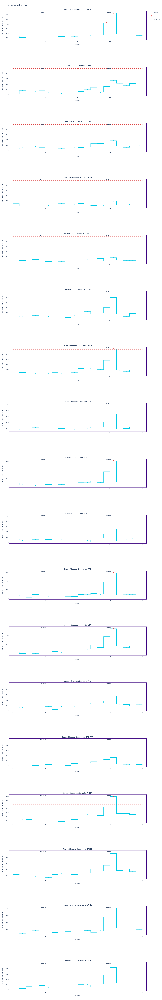

In [11]:
figure = results_univariate.filter( methods=['jensen_shannon']).plot(kind='drift')
figure.show()

Now let's try to use multivariate drift again to see if columns that didn't drift from the univariate perspective still exhibit drift from multivariate perspective.

In [12]:
alert_count_ranker = nml.AlertCountRanker()
alert_count_ranked_features = alert_count_ranker.rank(
    results_univariate.filter(methods=['jensen_shannon']),
    only_drifting = True)
display(alert_count_ranked_features)

,number_of_alerts,column_name,rank
0,2,AGEP,1
1,1,PINCP,2
2,1,MIG,3
3,1,MAR,4
4,1,ESR,5
5,1,DREM,6


In [13]:
drifting_features = alert_count_ranked_features.column_name.to_list()

In [14]:
stable_features = [
    col for col in feature_column_names
    if col not in drifting_features
]

In [15]:
multivariate_drift_on_stable_features_calc = nml.DataReconstructionDriftCalculator(
    column_names=stable_features,
    chunk_size=5000
)
multivariate_drift_on_stable_features_calc.fit(reference_df)

In [16]:
results_multivariate_on_stable_features = multivariate_drift_on_stable_features_calc.calculate(analysis_df)

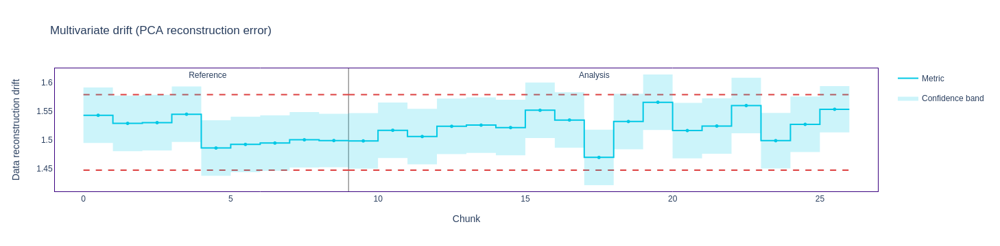

In [17]:
figure = results_multivariate_on_stable_features.plot()
figure.show()

Let's examine how the mean of all columns is changing over time

chunk                                                        \
              key chunk_index start_index end_index start_date end_date   
0        [0:4539]           0           0      4539       None     None   
1     [4540:9079]           1        4540      9079       None     None   
2    [9080:13619]           2        9080     13619       None     None   
3   [13620:18159]           3       13620     18159       None     None   
4   [18160:22699]           4       18160     22699       None     None   
5   [22700:27239]           5       22700     27239       None     None   
6   [27240:31779]           6       27240     31779       None     None   
7   [31780:36319]           7       31780     36319       None     None   
8   [36320:40859]           8       36320     40859       None     None   
9   [40860:45404]           9       40860     45404       None     None   
10       [0:8719]           0           0      8719       None     None   
11   [8720:17439]           1        8720     17439       None     None   
12  [17440:26159]           2       17440     26159       None     None   
13  [26160:34879]           3       26160     34879       None     None   
14  [34880:43599]           4       34880     43599       None     None   
15  [43600:52319]           5       43600     52319       None     None   
16  [52320:61039]           6       52320     61039       None     None   
17  [61040:69759]           7       61040     69759       None     None   
18  [69760:78479]           8       69760     78479       None     None   
19  [78480:87204]           9       78480     87204       None     None   

                    AGEP                                           ...  \
       period      value sampling_error upper_confidence_boundary  ...   
0   reference  37.061013       0.233596                 37.761802  ...   
1   reference  36.820044       0.233596                 37.520832  ...   
2   reference  36.884581       0.233596                 37.585370  ...   
3   reference  36.993612       0.233596                 37.694401  ...   
4   reference  36.088106       0.233596                 36.788894  ...   
5   reference  36.801322       0.233596                 37.502110  ...   
6   reference  36.466960       0.233596                 37.167749  ...   
7   reference  36.453304       0.233596                 37.154092  ...   
8   reference  36.694714       0.233596                 37.395502  ...   
9   reference  36.373817       0.233468                 37.074220  ...   
10   analysis  36.950115       0.168553                 37.455772  ...   
11   analysis  37.108257       0.168553                 37.613915  ...   
12   analysis  37.153555       0.168553                 37.659213  ...   
13   analysis  36.818807       0.168553                 37.324465  ...   
14   analysis  35.173968       0.168553                 35.679626  ...   
15   analysis  34.347362       0.168553                 34.853020  ...   
16   analysis  37.188417       0.168553                 37.694075  ...   
17   analysis  36.832225       0.168553                 37.337882  ...   
18   analysis  36.883142       0.168553                 37.388800  ...   
19   analysis  36.908424       0.168504                 37.413937  ...   

               FER                            RAC1P                 \
   upper_threshold lower_threshold  alert     value sampling_error   
0         0.866459        0.724725  False  1.998458       0.032119   
1         0.866459        0.724725  False  2.073789       0.032119   
2         0.866459        0.724725  False  1.937885       0.032119   
3         0.866459        0.724725  False  1.969824       0.032119   
4         0.866459        0.724725  False  1.993392       0.032119   
5         0.866459        0.724725  False  1.992731       0.032119   
6         0.866459        0.724725  False  1.992070       0.032119   
7         0.866459        0.724725  False  1.918943       0.032119   
8         0.866459        0.7247

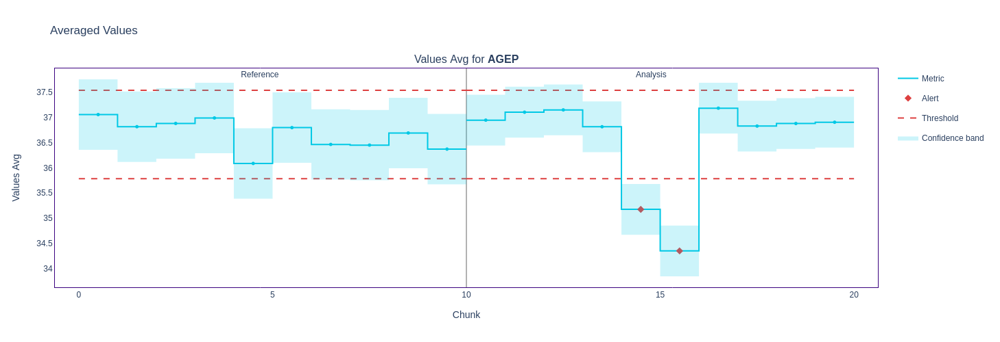

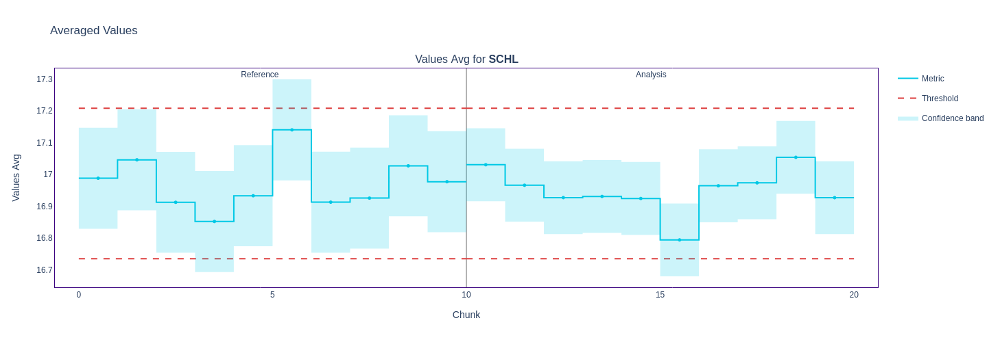

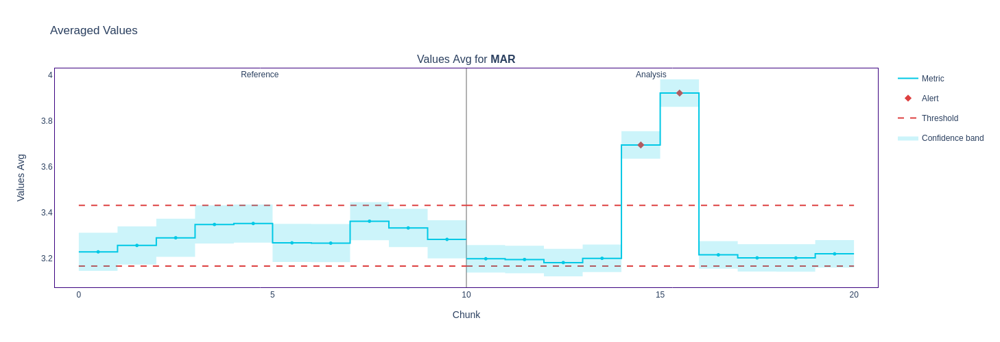

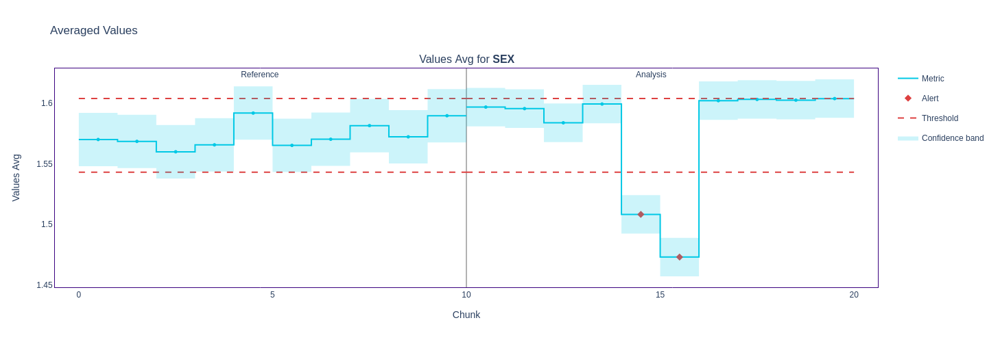

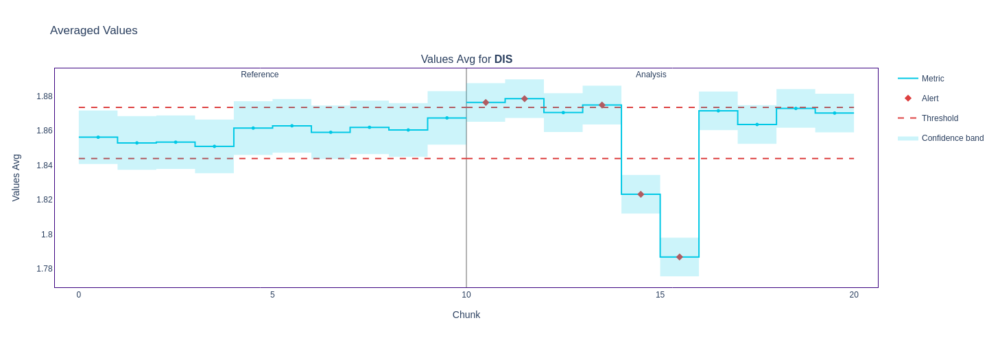

...

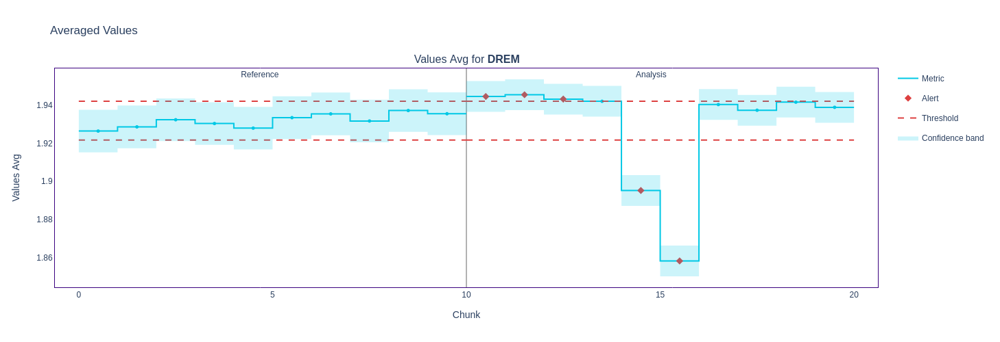

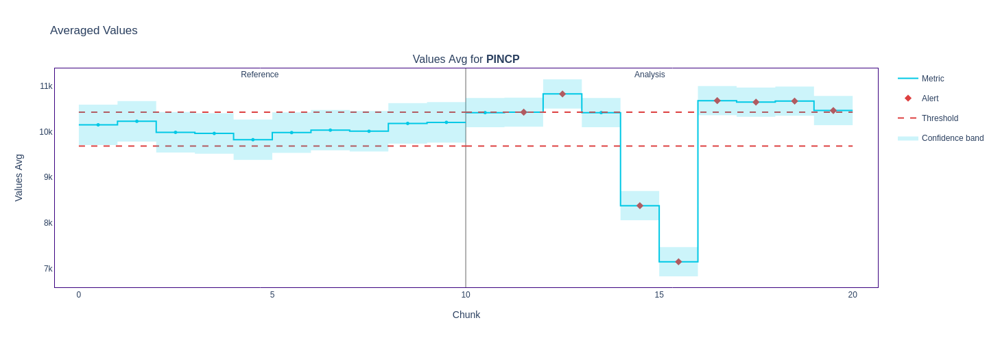

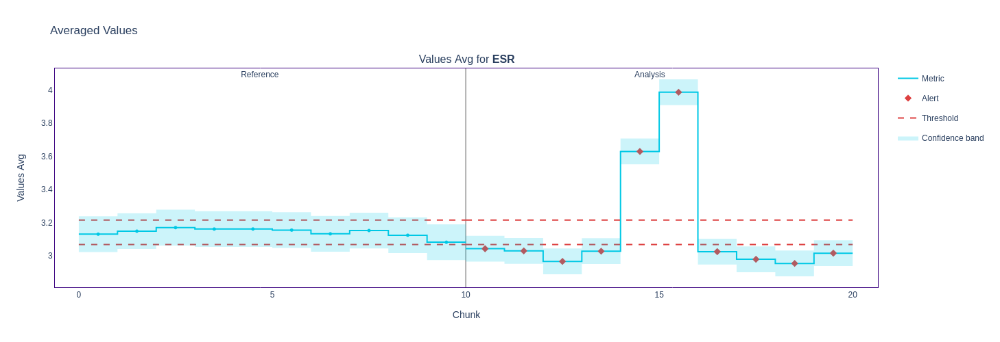

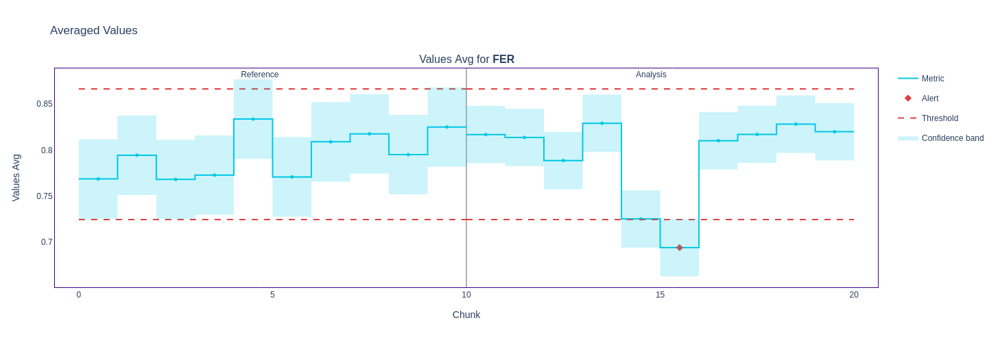

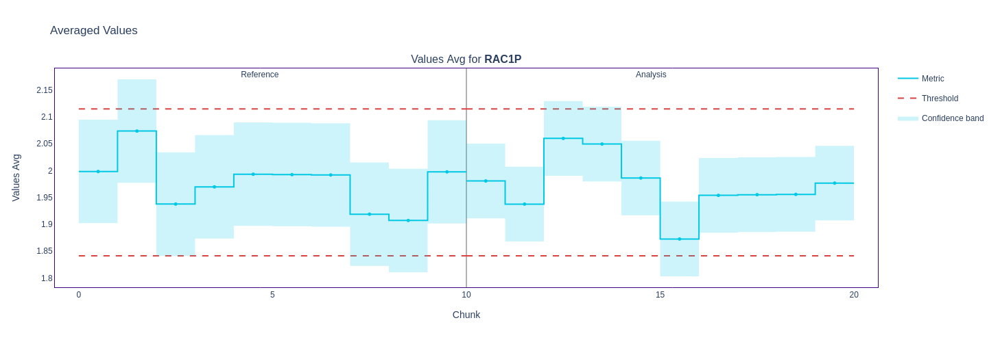

In [18]:
calc = nml.SummaryStatsAvgCalculator(
    column_names=feature_column_names,
)

calc.fit(reference_df)
results = calc.calculate(analysis_df)
display(results.filter(period='all').to_df())

for column_name in results.column_names:
    results.filter(column_names=column_name).plot().show()

In [19]:
calc_std = nml.SummaryStatsStdCalculator(column_names=feature_column_names)

calc_std.fit(reference_df)
results_std = calc_std.calculate(analysis_df)
display(results.filter(period='all').to_df())

chunk                                                        \
              key chunk_index start_index end_index start_date end_date   
0        [0:4539]           0           0      4539       None     None   
1     [4540:9079]           1        4540      9079       None     None   
2    [9080:13619]           2        9080     13619       None     None   
3   [13620:18159]           3       13620     18159       None     None   
4   [18160:22699]           4       18160     22699       None     None   
5   [22700:27239]           5       22700     27239       None     None   
6   [27240:31779]           6       27240     31779       None     None   
7   [31780:36319]           7       31780     36319       None     None   
8   [36320:40859]           8       36320     40859       None     None   
9   [40860:45404]           9       40860     45404       None     None   
10       [0:8719]           0           0      8719       None     None   
11   [8720:17439]           1        8720     17439       None     None   
12  [17440:26159]           2       17440     26159       None     None   
13  [26160:34879]           3       26160     34879       None     None   
14  [34880:43599]           4       34880     43599       None     None   
15  [43600:52319]           5       43600     52319       None     None   
16  [52320:61039]           6       52320     61039       None     None   
17  [61040:69759]           7       61040     69759       None     None   
18  [69760:78479]           8       69760     78479       None     None   
19  [78480:87204]           9       78480     87204       None     None   

                    AGEP                                           ...  \
       period      value sampling_error upper_confidence_boundary  ...   
0   reference  37.061013       0.233596                 37.761802  ...   
1   reference  36.820044       0.233596                 37.520832  ...   
2   reference  36.884581       0.233596                 37.585370  ...   
3   reference  36.993612       0.233596                 37.694401  ...   
4   reference  36.088106       0.233596                 36.788894  ...   
5   reference  36.801322       0.233596                 37.502110  ...   
6   reference  36.466960       0.233596                 37.167749  ...   
7   reference  36.453304       0.233596                 37.154092  ...   
8   reference  36.694714       0.233596                 37.395502  ...   
9   reference  36.373817       0.233468                 37.074220  ...   
10   analysis  36.950115       0.168553                 37.455772  ...   
11   analysis  37.108257       0.168553                 37.613915  ...   
12   analysis  37.153555       0.168553                 37.659213  ...   
13   analysis  36.818807       0.168553                 37.324465  ...   
14   analysis  35.173968       0.168553                 35.679626  ...   
15   analysis  34.347362       0.168553                 34.853020  ...   
16   analysis  37.188417       0.168553                 37.694075  ...   
17   analysis  36.832225       0.168553                 37.337882  ...   
18   analysis  36.883142       0.168553                 37.388800  ...   
19   analysis  36.908424       0.168504                 37.413937  ...   

               FER                            RAC1P                 \
   upper_threshold lower_threshold  alert     value sampling_error   
0         0.866459        0.724725  False  1.998458       0.032119   
1         0.866459        0.724725  False  2.073789       0.032119   
2         0.866459        0.724725  False  1.937885       0.032119   
3         0.866459        0.724725  False  1.969824       0.032119   
4         0.866459        0.724725  False  1.993392       0.032119   
5         0.866459        0.724725  False  1.992731       0.032119   
6         0.866459        0.724725  False  1.992070       0.032119   
7         0.866459        0.724725  False  1.918943       0.032119   
8         0.866459        0.7247

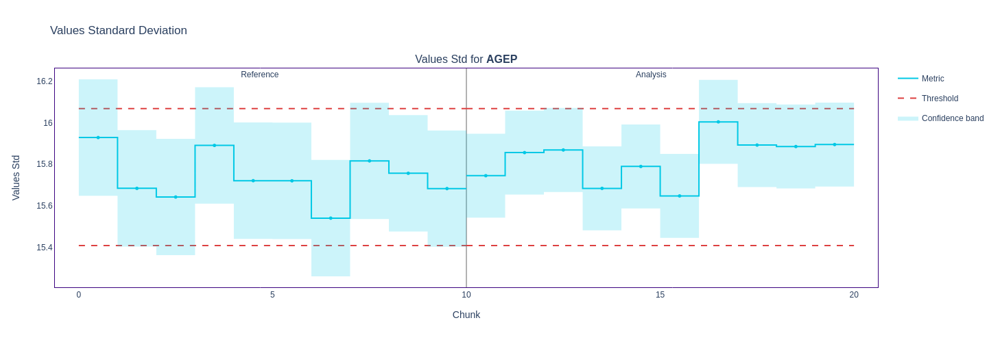

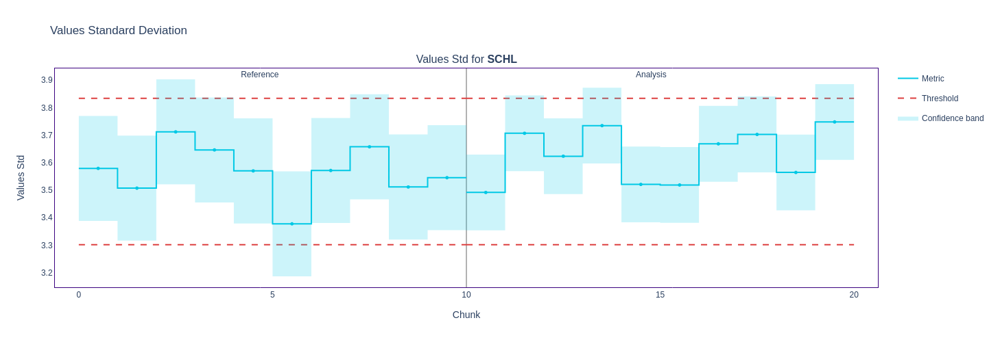

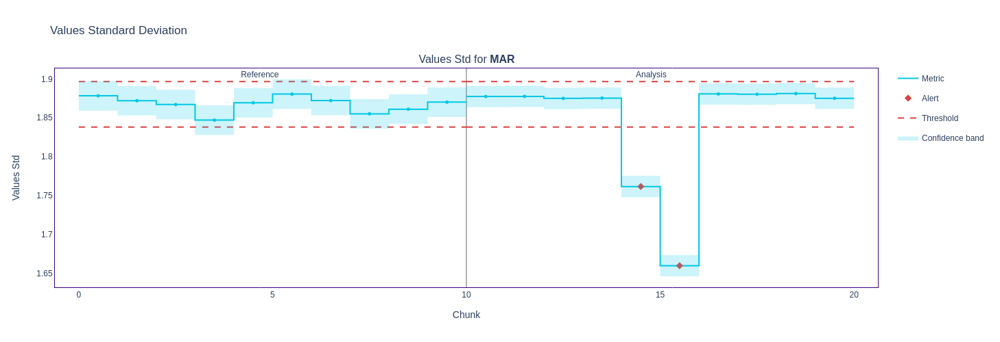

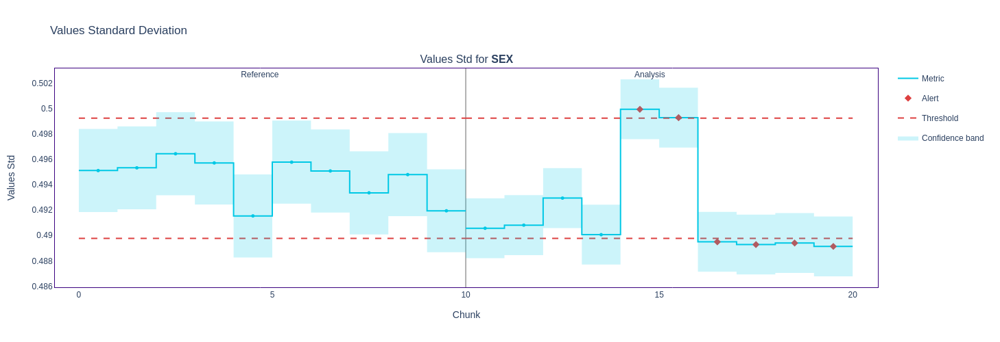

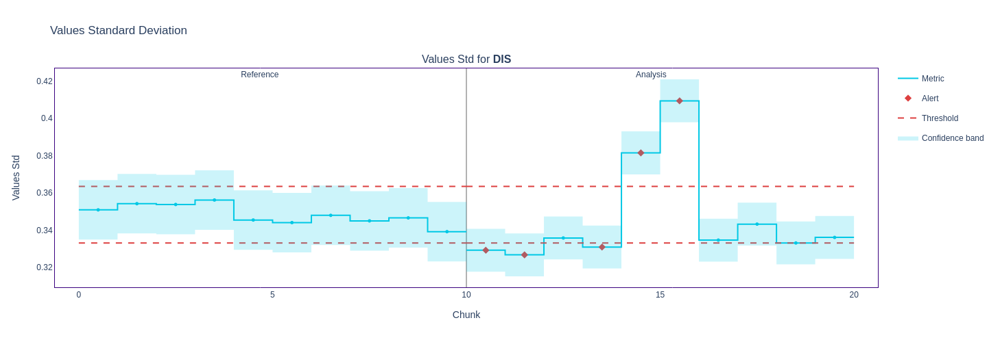

...

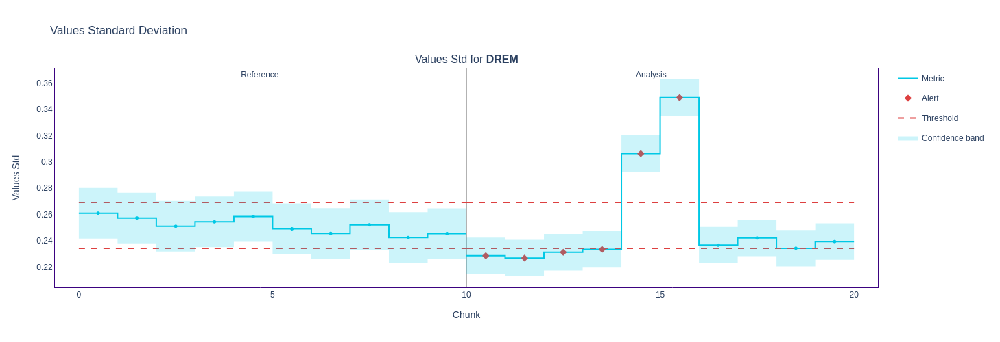

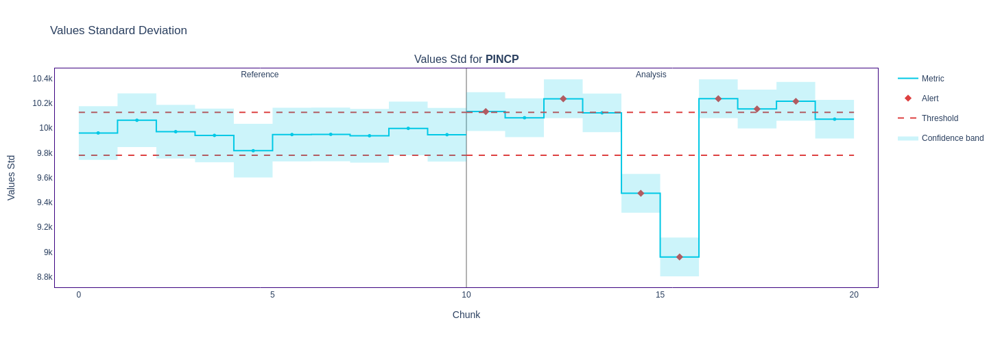

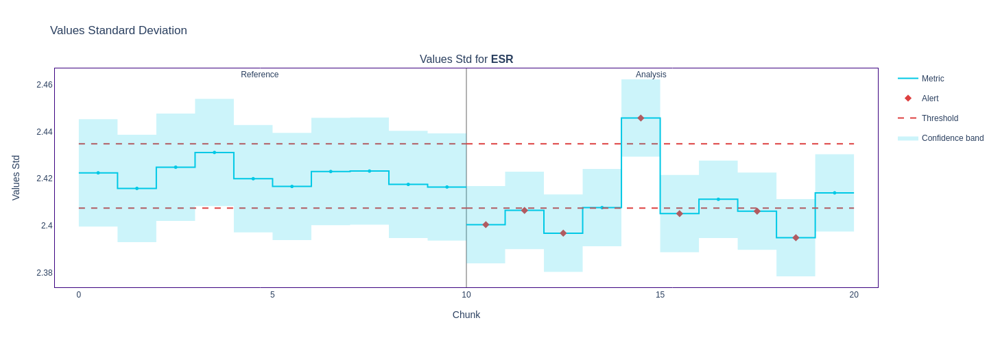

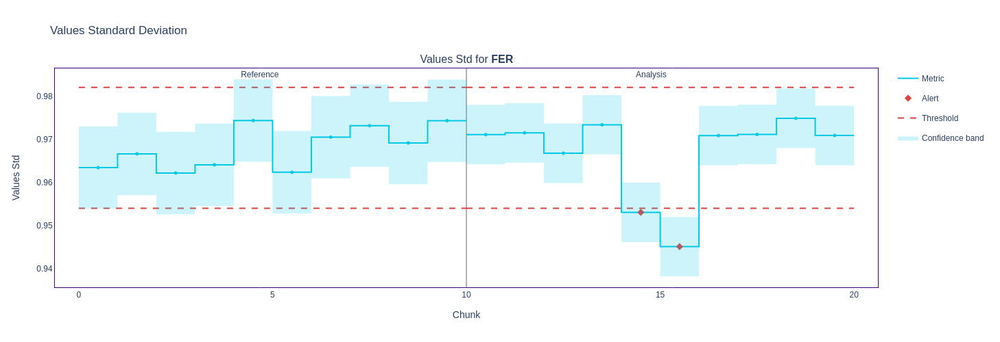

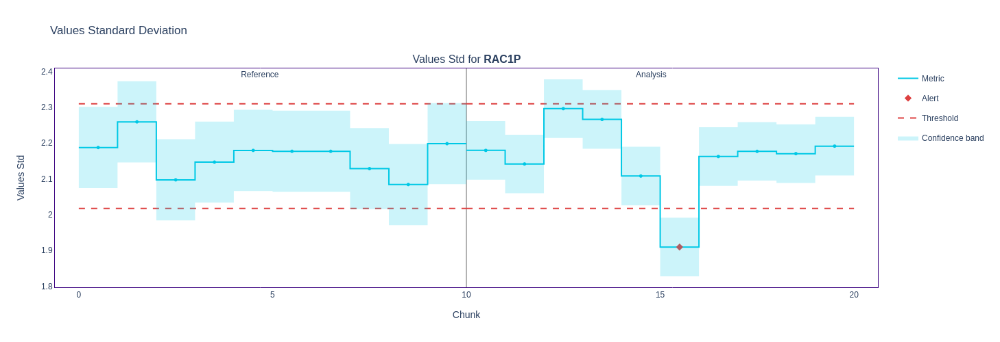

In [20]:
for column_name in results.column_names:
    results_std.filter(column_names=column_name).plot().show()

Finally, let's calculate realized performance to see whether performance estimation worked correctly.

In [21]:
calculator = nml.PerformanceCalculator(
    y_pred_proba='y_pred_proba',
    y_pred='y_pred',
    y_true='y_true',
    metrics=['roc_auc','f1','accuracy'],
    chunk_size=5000,
    problem_type='classification_binary',
).fit(reference_df)
realized_results = calculator.calculate(analysis_with_targets_df)
display(realized_results.filter(period='analysis').to_df())

chunk                                                        \
              key chunk_index start_index end_index start_date end_date   
0        [0:4999]           0           0      4999       None     None   
1     [5000:9999]           1        5000      9999       None     None   
2   [10000:14999]           2       10000     14999       None     None   
3   [15000:19999]           3       15000     19999       None     None   
4   [20000:24999]           4       20000     24999       None     None   
5   [25000:29999]           5       25000     29999       None     None   
6   [30000:34999]           6       30000     34999       None     None   
7   [35000:39999]           7       35000     39999       None     None   
8   [40000:44999]           8       40000     44999       None     None   
9   [45000:49999]           9       45000     49999       None     None   
10  [50000:54999]          10       50000     54999       None     None   
11  [55000:59999]          11       55000     59999       None     None   
12  [60000:64999]          12       60000     64999       None     None   
13  [65000:69999]          13       65000     69999       None     None   
14  [70000:74999]          14       70000     74999       None     None   
15  [75000:79999]          15       75000     79999       None     None   
16  [80000:87204]          16       80000     87204       None     None   

                                         roc_auc            ...  \
      period targets_missing_rate sampling_error     value  ...   
0   analysis                  0.0       0.005950  0.794369  ...   
1   analysis                  0.0       0.005950  0.785964  ...   
2   analysis                  0.0       0.005950  0.771888  ...   
3   analysis                  0.0       0.005950  0.783485  ...   
4   analysis                  0.0       0.005950  0.784897  ...   
5   analysis                  0.0       0.005950  0.784437  ...   
6   analysis                  0.0       0.005950  0.788055  ...   
7   analysis                  0.0       0.005950  0.776193  ...   
8   analysis                  0.0       0.005950  0.820491  ...   
9   analysis                  0.0       0.005950  0.821336  ...   
10  analysis                  0.0       0.005950  0.787601  ...   
11  analysis                  0.0       0.005950  0.784590  ...   
12  analysis                  0.0       0.005950  0.783583  ...   
13  analysis                  0.0       0.005950  0.791393  ...   
14  analysis                  0.0       0.005950  0.778421  ...   
15  analysis                  0.0       0.005950  0.787766  ...   
16  analysis                  0.0       0.004957  0.791138  ...   

               f1                                                   \
   sampling_error     value upper_threshold lower_threshold  alert   
0        0.015854  0.541601         0.60112        0.550039   True   
1        0.015854  0.549865         0.60112        0.550039   True   
2        0.015854  0.539585         0.60112        0.550039   True   
3        0.015854  0.555643         0.60112        0.550039  False   
4        0.015854  0.540033         0.60112        0.550039   True   
5        0.015854  0.542136         0.60112        0.550039   True   
6        0.015854  0.558517         0.60112        0.550039  False   
7        0.015854  0.537795         0.60112        0.550039   True   
8        0.015854  0.668776         0.60112        0.550039   True   
9        0.015854  0.659707         0.60112        0.550039   True   
10       0.015854  0.551913         0.60112        0.550039  False   
11       0.015854  0.543320         0.60112        0.550039   True   
12       0.015854  0.539539         0.60112        0.550039   True   
13       0.015854  0.546939         0.60112        0.550039   True   
14       0.015854  0.529484         0.60112        0.550039   True   
15       0.015854  0.560500         0.60112        0.550039  False   
16       0.013207  0.543587         0.60112        0

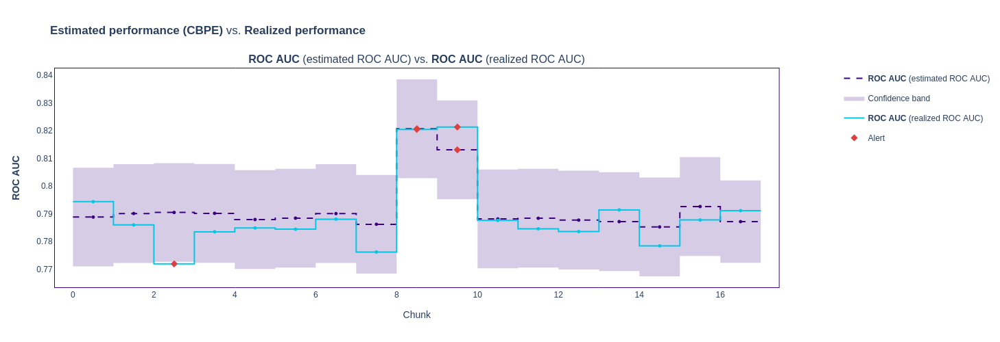

In [22]:
# Show comparison plot
results_performance_estimation.filter(period='analysis', metrics=['roc_auc']).compare(realized_results.filter(period='analysis', metrics=['roc_auc'])).plot().show()

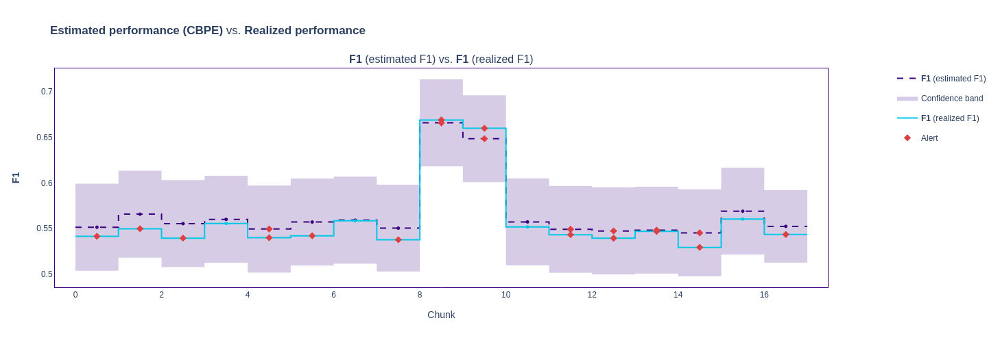

In [23]:
results_performance_estimation.filter(period='analysis', metrics=['f1']).compare(realized_results.filter(period='analysis', metrics=['f1'])).plot().show()

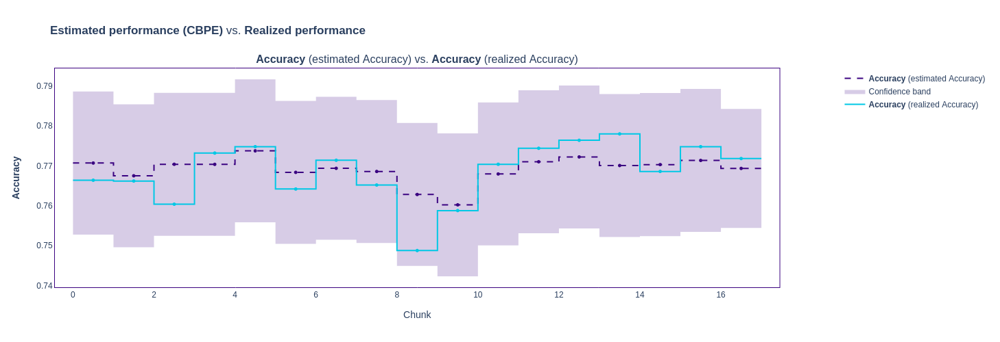

In [24]:
results_performance_estimation.filter(period='analysis', metrics=['accuracy']).compare(realized_results.filter(period='analysis', metrics=['accuracy'])).plot().show()